# Importing necessary Libraries

In [1]:
import re
import string
import numpy as np 
import random
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


import nltk
from nltk.corpus import stopwords

from tqdm import tqdm
import os
import nltk
import spacy
import random
from spacy.util import compounding
from spacy.util import minibatch

import warnings
warnings.filterwarnings("ignore")


# Load the Data Set

In [2]:
df=pd.read_csv('final_amazon_reviews.csv')
df.head()

,Unnamed: 0,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title
0,0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle
1,1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast
2,2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.
3,3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!
4,4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids


# Info about the Data Set

In [3]:
df.duplicated().sum()   # checking for any duplicates present in the data set

0

In [4]:
df.info()  # info about the data set

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35631 entries, 0 to 35630
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           35631 non-null  int64  
 1   brand                35631 non-null  object 
 2   manufacturer         35631 non-null  object 
 3   reviews.doRecommend  35037 non-null  object 
 4   reviews.rating       35598 non-null  float64
 5   reviews.text         35630 non-null  object 
 6   reviews.title        35625 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 1.9+ MB


In [5]:
df.isnull().sum()  # checking for null values

Unnamed: 0               0
brand                    0
manufacturer             0
reviews.doRecommend    594
reviews.rating          33
reviews.text             1
reviews.title            6
dtype: int64

In [6]:
df.dropna(inplace=True)  # dropping the null values

In [7]:
df.isnull().sum()

Unnamed: 0             0
brand                  0
manufacturer           0
reviews.doRecommend    0
reviews.rating         0
reviews.text           0
reviews.title          0
dtype: int64

In [8]:
df.drop('Unnamed: 0',axis=1,inplace=True)  # dropping the unwanted column

In [9]:
df.head()

,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title
0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle
1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast
2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.
3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!
4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids


# TEXT PRE-PROCESSING

In [10]:
import nltk
nltk.download('punkt')   # importing  the neccessary librares for text preprocessing
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to /Users/apple/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/apple/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/apple/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/apple/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/apple/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [11]:
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer


def preprocess_text_adjusted(text):
    # Lowercasing
    text = text.lower()
    
    # Remove special characters and digits, punctuation
    text = ''.join(char for char in text if char.isalnum() or char.isspace() or char in ['!', '?', ','])
    
    # Tokenization
    words = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    
    # lemmatizing
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    # Join the processed words back into a sentence
    processed_text = ' '.join(words)
    
    return processed_text
df['reviews.text_adjusted'] = df['reviews.text'].apply(preprocess_text_adjusted)
print(df)    # applying the above created function to the given text

        brand manufacturer reviews.doRecommend  reviews.rating  \
0      Amazon       Amazon                True             5.0   
1      Amazon       Amazon                True             5.0   
2      Amazon       Amazon                True             5.0   
3      Amazon       Amazon                True             4.0   
4      Amazon       Amazon                True             5.0   
...       ...          ...                 ...             ...   
35626  Amazon       Amazon                True             3.0   
35627  Amazon       Amazon                True             5.0   
35628  Amazon       Amazon                True             5.0   
35629  Amazon       Amazon                True             5.0   
35630  Amazon       Amazon                True             4.0   

                                            reviews.text  \
0      This product so far has not disappointed. My c...   
1      great for beginner or experienced person. Boug...   
2      Inexpensive tablet f

In [12]:
df.head()

,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title,reviews.text_adjusted
0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle,product far disappointed child love use like a...
1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast,great beginner experienced person bought gift ...
2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,"inexpensive tablet use learn , step nabi thril..."
3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!,ive fire hd 8 two week love tablet great value...
4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,"bought grand daughter come visit set user , en..."


In [13]:
from textblob import TextBlob
df['sentiment'] = df['reviews.text_adjusted'].apply(lambda text: 'positive' if TextBlob(text).sentiment.polarity > 0.1 else ('negative' if TextBlob(text).sentiment.polarity < -0.1 else 'neutral'))

# based on the polarity score calculated by TextBlob classifing the the reviews into positive,negative,nuetral

In [14]:
df.head()

,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title,reviews.text_adjusted,sentiment
0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle,product far disappointed child love use like a...,neutral
1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast,great beginner experienced person bought gift ...,positive
2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,"inexpensive tablet use learn , step nabi thril...",positive
3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!,ive fire hd 8 two week love tablet great value...,positive
4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,"bought grand daughter come visit set user , en...",positive


In [15]:
df['sentiment'].value_counts() # checking the no of reviews for each sentiment

sentiment
positive    29185
neutral      4063
negative     1784
Name: count, dtype: int64

# Exploratory Data Analysis

In [16]:
df.head()

,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title,reviews.text_adjusted,sentiment
0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle,product far disappointed child love use like a...,neutral
1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast,great beginner experienced person bought gift ...,positive
2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,"inexpensive tablet use learn , step nabi thril...",positive
3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!,ive fire hd 8 two week love tablet great value...,positive
4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,"bought grand daughter come visit set user , en...",positive


In [17]:
df.describe(include='object')

,brand,manufacturer,reviews.doRecommend,reviews.text,reviews.title,reviews.text_adjusted,sentiment
count,35032,35032,35032,35032,35032,35032,35032
unique,5,4,2,34509,19759,34414,3
top,Amazon,Amazon,True,A little more complicated than my original kin...,Great product,"little complicated original kindle , like",positive
freq,28655,34590,33267,8,644,8,29185


In [18]:
temp = df.groupby('sentiment').count()['reviews.text_adjusted'].reset_index().sort_values(by='reviews.text_adjusted',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,reviews.text_adjusted
2,positive,29185
1,neutral,4063
0,negative,1784


<Axes: xlabel='sentiment', ylabel='count'>

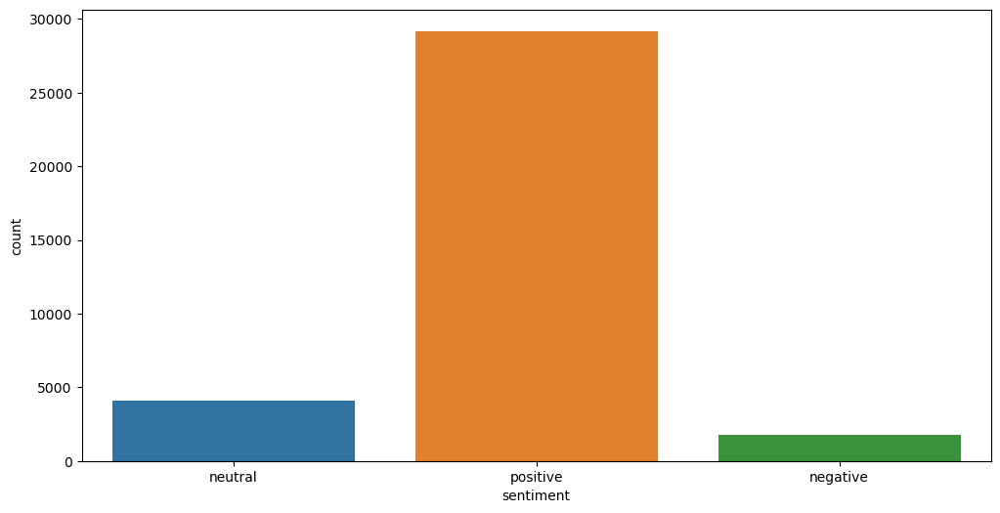

In [19]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df)

In [20]:
# Here we can see that for positive sentiment we have large no of reviews compared to neutral and Negative

In [21]:
fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp['reviews.text_adjusted'],
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

In [22]:
# The percentage of class imbalace prasent in the target variable

In [23]:
def jaccard(str1, str2): 
    a = set(str1.lower().split()) #creating the function to the no of words difference between original text and 
    b = set(str2.lower().split()) # the text after preprocessing
    c = a.intersection(b)
    return float(len(c)) / (len(a) + len(b) - len(c))

In [24]:
results_jaccard=[]  # creating a column

for ind,row in df.iterrows():
    sentence1 = row['reviews.text']
    sentence2 = row['reviews.text_adjusted']

    jaccard_score = jaccard(sentence1,sentence2)
    results_jaccard.append([sentence1,sentence2,jaccard_score])

In [25]:
jaccard = pd.DataFrame(results_jaccard,columns=["reviews.text","reviews.text_adjusted","jaccard_score"])
df = df.merge(jaccard,how='outer') # adding the column to the dataset

In [26]:
df['Num_words_RTA'] = df['reviews.text_adjusted'].apply(lambda x:len(str(x).split())) 
df['Num_word_RT'] = df['reviews.text'].apply(lambda x:len(str(x).split())) 
df['difference_in_words'] = df['Num_word_RT'] - df['Num_words_RTA'] # adding the columns with no of words in original tet and text adjusted

In [27]:
df.head()

,brand,manufacturer,reviews.doRecommend,reviews.rating,reviews.text,reviews.title,reviews.text_adjusted,sentiment,jaccard_score,Num_words_RTA,Num_word_RT,difference_in_words
0,Amazon,Amazon,True,5.0,This product so far has not disappointed. My c...,Kindle,product far disappointed child love use like a...,neutral,0.344828,13,27,14
1,Amazon,Amazon,True,5.0,great for beginner or experienced person. Boug...,very fast,great beginner experienced person bought gift ...,positive,0.312500,7,14,7
2,Amazon,Amazon,True,5.0,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,"inexpensive tablet use learn , step nabi thril...",positive,0.259259,12,26,14
3,Amazon,Amazon,True,4.0,I've had my Fire HD 8 two weeks now and I love...,Good!!!,ive fire hd 8 two week love tablet great value...,positive,0.447917,60,117,57
4,Amazon,Amazon,True,5.0,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,"bought grand daughter come visit set user , en...",positive,0.336735,53,117,64


In [28]:
hist_data = [df['Num_words_RTA'],df['Num_word_RT']]

group_labels = ['Text_Adjusted', 'Text']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels,show_curve=False)
fig.update_layout(title_text='Distribution of Number Of words')
fig.update_layout(
    autosize=False,
    width=900,
    height=700,
    paper_bgcolor="LightSteelBlue",
)
fig.show()


In [29]:
# from the above plot we can say that len of original text contain max of 1539 words in a single review when the text 
# is preprocessed the len decresed to 809 words 

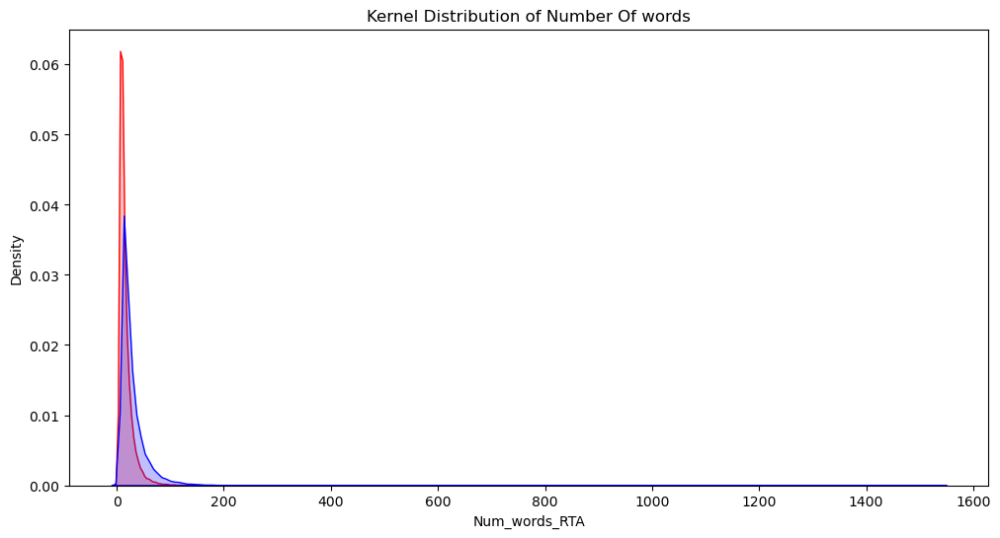

In [30]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df['Num_words_RTA'], shade=True, color="r").set_title('Kernel Distribution of Number Of words')
p1=sns.kdeplot(df['Num_word_RT'], shade=True, color="b")

In [31]:
#comparing the distribution of the number of words in the 'Num_words_RTA' and 'Num_word_RT' columns 
#using kernel density plots.

#The red plot represents the distribution of the number of words in the 'Num_words_RTA' column, 
#while the blue plot represents the distribution of the number of words in the 'Num_word_RT' column.

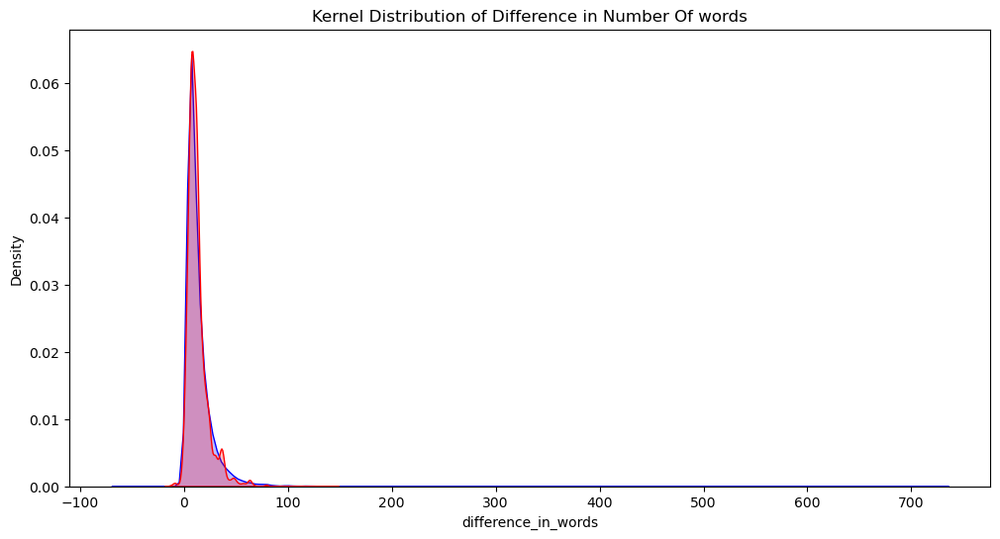

In [32]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df[df['sentiment']=='positive']['difference_in_words'], shade=True, color="b").set_title('Kernel Distribution of Difference in Number Of words')
p2=sns.kdeplot(df[df['sentiment']=='negative']['difference_in_words'], shade=True, color="r")

In [33]:
#visualize and compare the distribution of the 'difference_in_words' column for 
#positive and negative sentiment classes using side-by-side kernel density plots.

#The blue plot represents the distribution of the 'difference_in_words' for rows where the sentiment 
#is positive, and the red plot represents the distribution for rows with negative sentiment.

<Axes: xlabel='difference_in_words'>

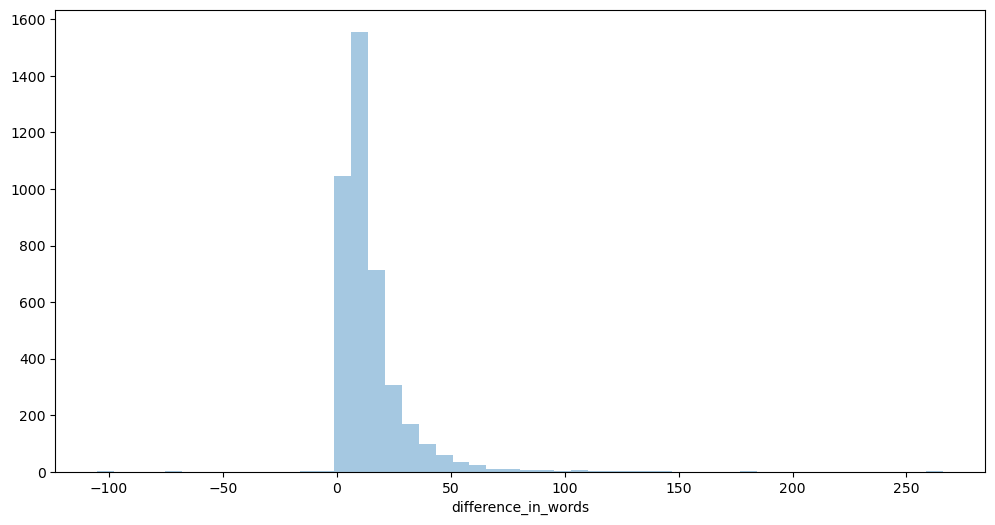

In [34]:
plt.figure(figsize=(12,6))
sns.distplot(df[df['sentiment']=='neutral']['difference_in_words'],kde=False)

In [35]:
# visualize and analyze the distribution of the 'difference_in_words' column specifically 
#for rows with neutral sentiment using a histogram.

#The histogram provides a discrete representation of the distribution, indicating the frequency or count 
#of 'difference_in_words' values within specified bins.

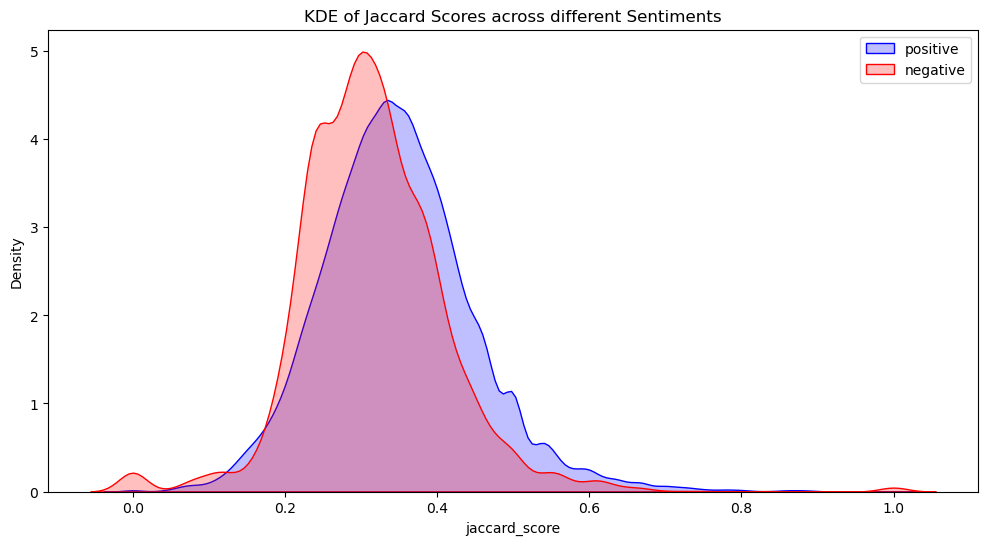

In [36]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df[df['sentiment']=='positive']['jaccard_score'], shade=True, color="b").set_title('KDE of Jaccard Scores across different Sentiments')
p2=sns.kdeplot(df[df['sentiment']=='negative']['jaccard_score'], shade=True, color="r")
plt.legend(labels=['positive','negative'])

In [37]:
# visualize and compare the distribution of Jaccard scores for positive and negative 
#sentiment classes using side-by-side kernel density plots.

#The blue plot represents the distribution of Jaccard scores for rows where the sentiment is positive,
#and the red plot represents the distribution for rows with negative sentiment.

<Axes: xlabel='jaccard_score'>

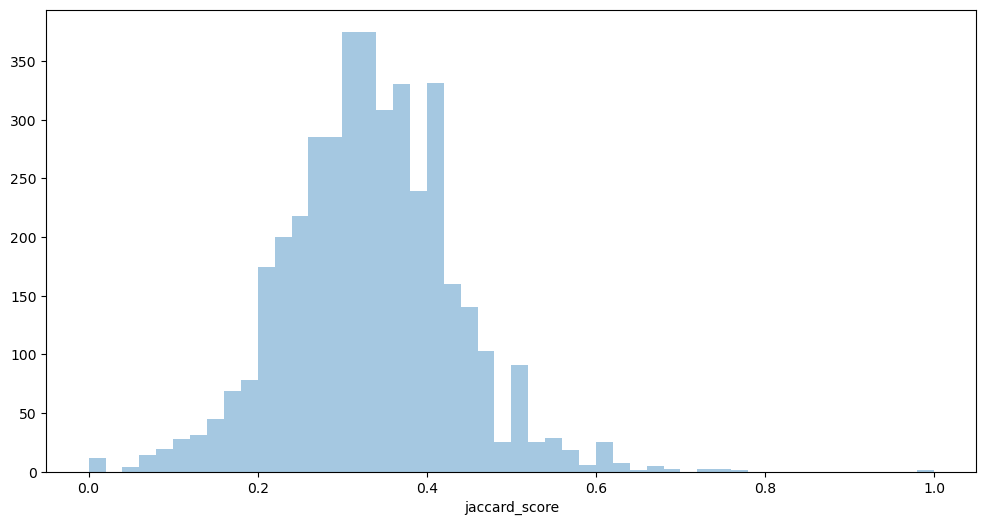

In [38]:
plt.figure(figsize=(12,6))
sns.distplot(df[df['sentiment']=='neutral']['jaccard_score'],kde=False)

In [39]:
#visualize and analyze the distribution of Jaccard scores specifically for rows with neutral 
#sentiment using a histogram.

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

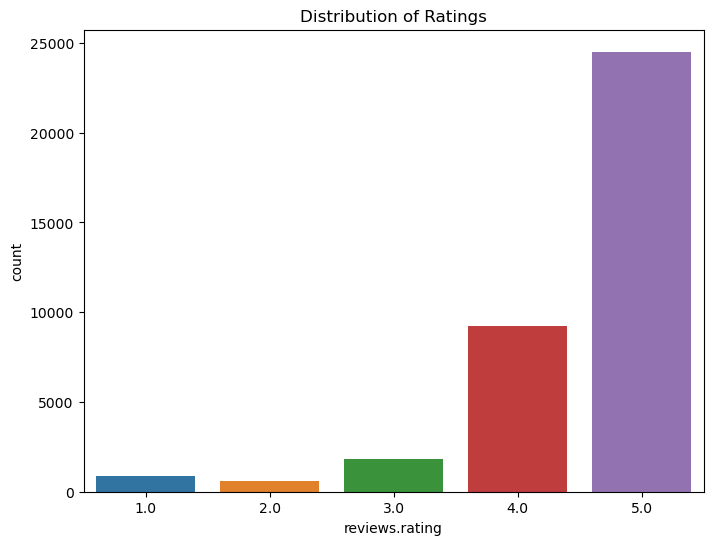

In [41]:
plt.figure(figsize=(8, 6))
sns.countplot(x='reviews.rating', data=df)
plt.title('Distribution of Ratings')
plt.show()

In [42]:
#visualize the distribution of ratings in the dataset using a count plot.

#Each bar in the plot represents the count of occurrences for a specific rating value. 
#The x-axis corresponds to the different rating values.

#his type of plot is useful for understanding the frequency or distribution of 
#categorical variables, in this case, the distribution of ratings.

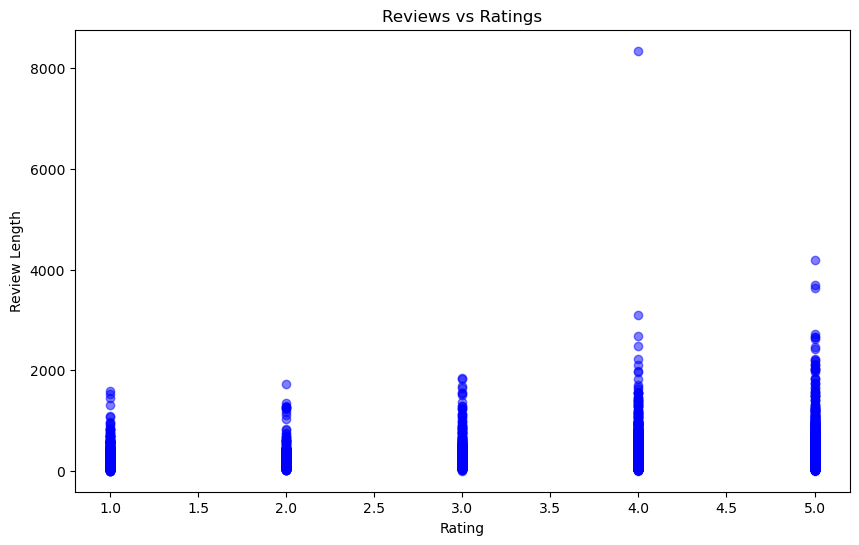

In [43]:
df['review_length'] = df['reviews.text'].apply(len)
plt.figure(figsize=(10, 6))
plt.scatter(df['reviews.rating'], df['review_length'], alpha=0.5, color='blue')
plt.title('Reviews vs Ratings')
plt.xlabel('Rating')
plt.ylabel('Review Length')
plt.show()

In [44]:
#The scatter plot visually explores the potential relationship between the length of reviews and their 
#corresponding ratings.

#Each point in the plot represents a review, where the x-coordinate is the rating, and the y-coordinate is
#the length of the review.

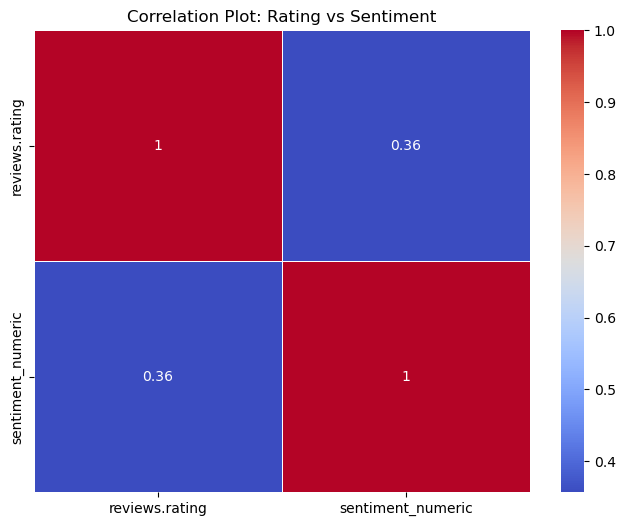

In [45]:
sentiment_mapping = {'negative': -1, 'neutral': 0, 'positive': 1}
df['sentiment_numeric'] = df['sentiment'].map(sentiment_mapping)

#  correlation matrix
correlation_matrix = df[['reviews.rating', 'sentiment_numeric']].corr()

#  heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Plot: Rating vs Sentiment')
plt.show()

In [46]:
#explore and visualize the correlation between numeric ratings and numeric sentiment values 
#using a correlation matrix and heatmap.

#The correlation matrix is a square matrix representing the pairwise correlations between variables. 
#In this case, it explores the correlation between 'reviews.rating' and 'sentiment_numeric'.

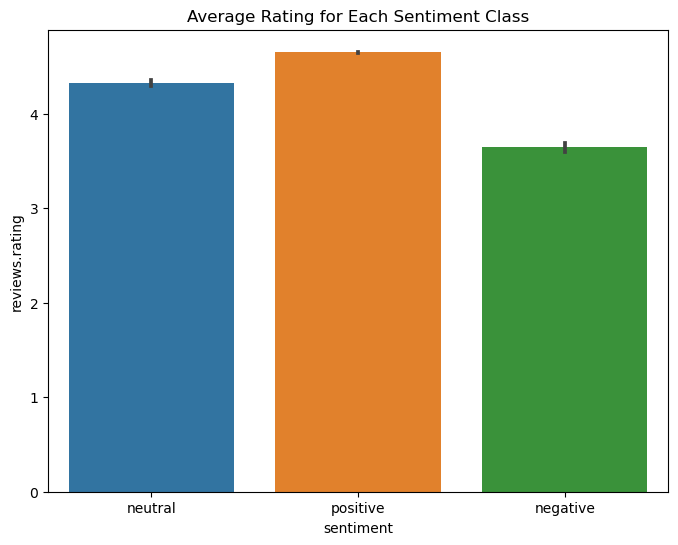

In [47]:
plt.figure(figsize=(8, 6))
sns.barplot(x='sentiment', y='reviews.rating', data=df)
plt.title('Average Rating for Each Sentiment Class')
plt.show()


In [48]:
#visualize and compare the average ratings for each sentiment class using a bar plot.

#Each bar represents the average rating for a specific sentiment class, and the error bars may 
#indicate the confidence interval around the average.

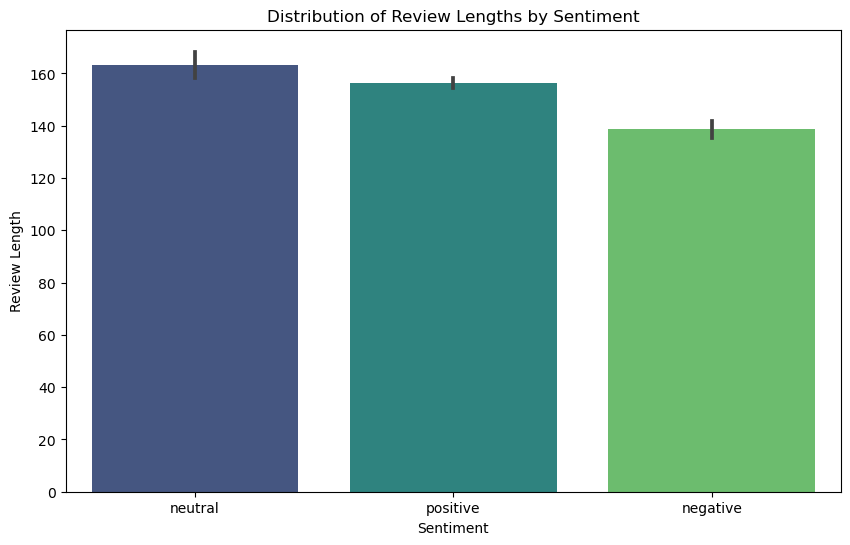

In [49]:
plt.figure(figsize=(10, 6))
sns.barplot(x='sentiment', y='review_length', data=df, palette='viridis')
plt.title('Distribution of Review Lengths by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Review Length')
plt.show()

In [50]:
#visualize and compare the distribution of review lengths for each sentiment class using a bar plot.


#Each bar represents the average review length for a specific sentiment class. The color palette 
#'viridis' provides a visually appealing color scheme.

In [51]:
df.groupby('brand')['sentiment'].value_counts()

brand           sentiment
Amazon          positive     24129
                neutral       3317
                negative      3085
Amazon Echo     positive       553
                neutral         68
                negative        28
Amazon Fire     positive       212
                neutral         33
                negative        13
Amazon Fire Tv  positive      4291
                neutral        645
                negative       116
Amazonbasics    negative       566
Name: count, dtype: int64

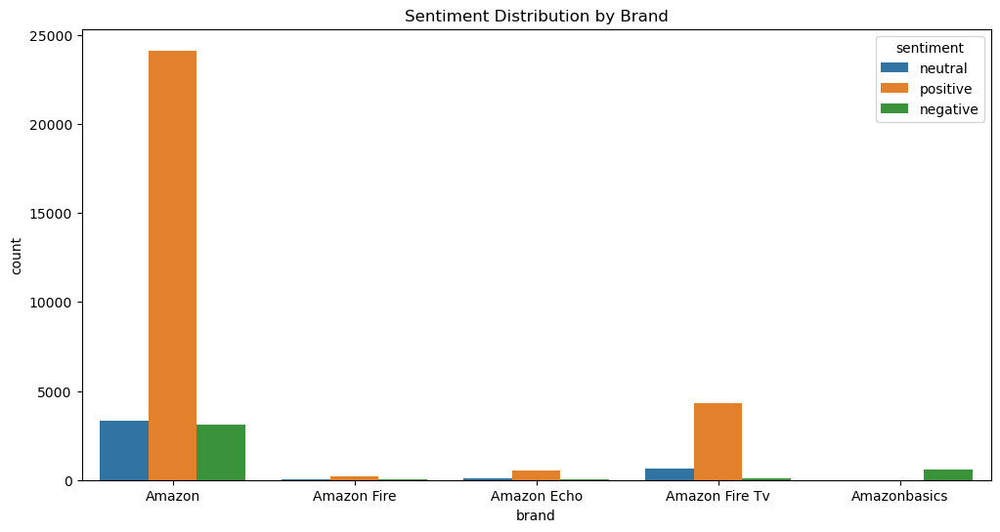

In [52]:
plt.figure(figsize=(12, 6))
sns.countplot(x='brand', hue='sentiment', data=df)
plt.title('Sentiment Distribution by Brand')
plt.show()

In [53]:
#visualize and compare the distribution of sentiment labels for each brand using a count plot.

#Each bar in the plot represents the count of reviews for a specific brand, and the different colors within 
#each bar represent the distribution of sentiment labels ('negative', 'neutral', 'positive').

In [54]:
from nltk import bigrams
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def get_bigrams(sentiment_category):
    selected_reviews = df[df['sentiment'] == sentiment_category]['reviews.text_adjusted']
    text = ' '.join(selected_reviews)
    
    # Tokenizing the text
    tokens = word_tokenize(text)

    # Removing stopwords
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [token for token in tokens if token.lower() not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Removing non-alphanumeric characters
    lemmatized_tokens = [token for token in lemmatized_tokens if token.isalnum() or token.isspace()]

    # Removing single characters
    lemmatized_tokens = [token for token in lemmatized_tokens if len(token) > 1]

    # Extracting bigrams
    sentiment_bigrams = list(bigrams(lemmatized_tokens))

    return sentiment_bigrams

positive_bigrams = get_bigrams('positive')
negative_bigrams = get_bigrams('negative')
neutral_bigrams = get_bigrams('neutral')
print("Positive Review Bigrams:", positive_bigrams[:10])
print("Negative Review Bigrams:", negative_bigrams[:10])
print("Neutral Review Bigrams:", neutral_bigrams[:10])

#provides insights into the common pairs of adjacent words (bigrams) 
#that appear in reviews of different sentiment categories.

Positive Review Bigrams: [('great', 'beginner'), ('beginner', 'experienced'), ('experienced', 'person'), ('person', 'bought'), ('bought', 'gift'), ('gift', 'love'), ('love', 'inexpensive'), ('inexpensive', 'tablet'), ('tablet', 'use'), ('use', 'learn')]
Negative Review Bigrams: [('really', 'like'), ('like', 'tablet'), ('tablet', 'would'), ('would', 'given'), ('given', 'star'), ('star', 'sometimes'), ('sometimes', 'push'), ('push', 'start'), ('start', 'several'), ('several', 'time')]
Neutral Review Bigrams: [('product', 'far'), ('far', 'disappointed'), ('disappointed', 'child'), ('child', 'love'), ('love', 'use'), ('use', 'like'), ('like', 'ability'), ('ability', 'monitor'), ('monitor', 'control'), ('control', 'content')]


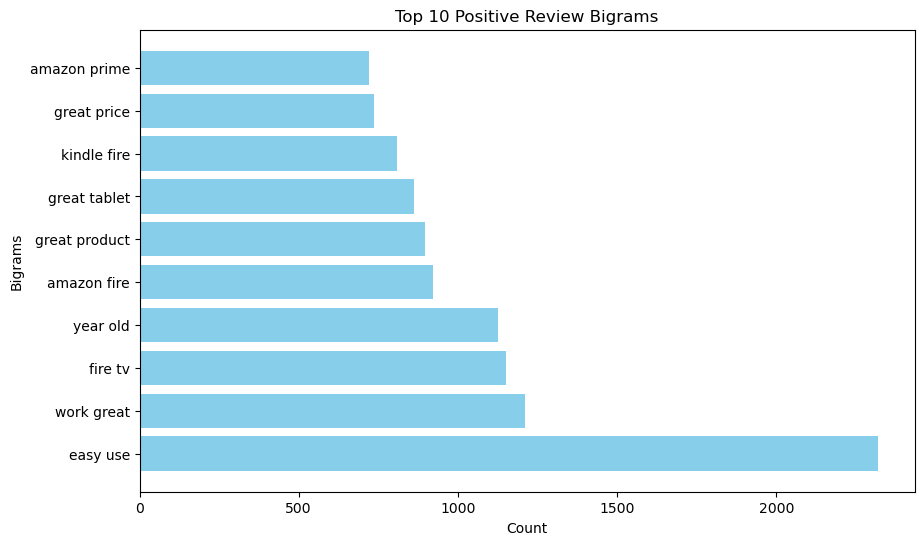

In [55]:
from collections import Counter

# Count the occurrences of each bigram in each sentiment category
positive_bigram_counts = Counter(positive_bigrams)
negative_bigram_counts = Counter(negative_bigrams)
neutral_bigram_counts = Counter(neutral_bigrams)

# Get the top N bigrams for each sentiment category
num_top_bigrams = 10
top_positive_bigrams = positive_bigram_counts.most_common(num_top_bigrams)
top_negative_bigrams = negative_bigram_counts.most_common(num_top_bigrams)
top_neutral_bigrams = neutral_bigram_counts.most_common(num_top_bigrams)

# Function to plot bigrams
def plot_bigrams(top_bigrams, title):
    bigrams, counts = zip(*top_bigrams)
    bigrams = [' '.join(bigram) for bigram in bigrams]  # Join the bigrams into a single string
    plt.figure(figsize=(10, 6))
    plt.barh(bigrams, counts, color='skyblue')
    plt.title(title)
    plt.xlabel('Count')
    plt.ylabel('Bigrams')
    plt.show()

# Plot the top N bigrams for each sentiment category
plot_bigrams(top_positive_bigrams, 'Top 10 Positive Review Bigrams')


In [56]:
#provide insights into the most common bigrams associated with positive sentiment in the dataset.

#The top 10 positive bigrams, based on their frequency of occurrence, are visualized in a horizontal bar plot.

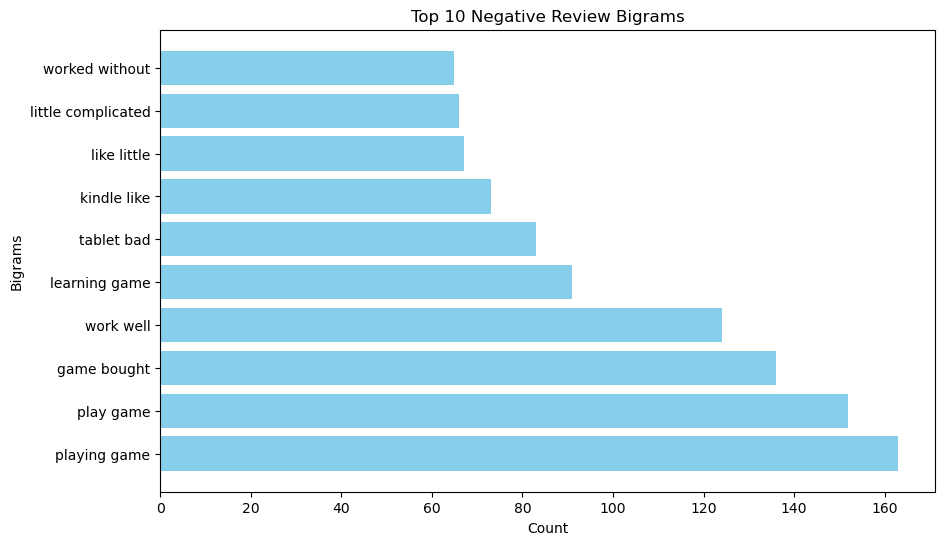

In [57]:
plot_bigrams(top_negative_bigrams, 'Top 10 Negative Review Bigrams')


In [58]:
#provide insights into the most common bigrams associated with Negative sentiment in the dataset.

#The top 10 Negative bigrams, based on their frequency of occurrence, are visualized in a horizontal bar plot.

In [59]:
import wordcloud

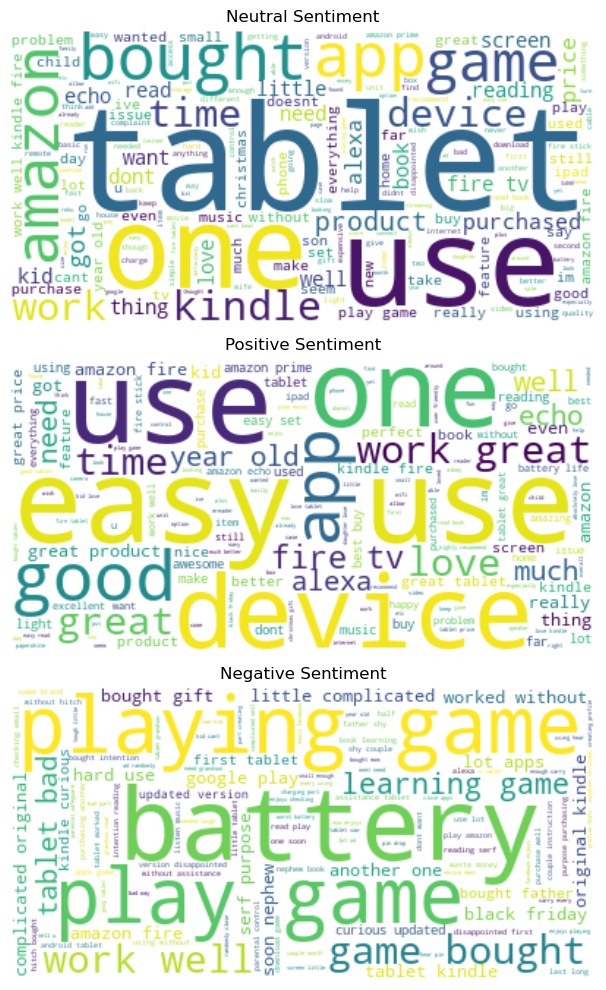

In [60]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
def generate_wordcloud(sentiment, ax):
    # Combining reviews for the specified sentiment into a single text
    text = ' '.join(df[df['sentiment'] == sentiment]['reviews.text_adjusted'])

    # Generating the word cloud
    wordcloud = WordCloud(width=400, height=200, background_color='white').generate(text)

    # Ploting the word cloud
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')  # Turn off axis labels
    ax.set_title(f'{sentiment.capitalize()} Sentiment')

# Creating subplots
fig, axes = plt.subplots(3, 1, figsize=(15, 10))

# Generating word clouds for each sentiment category
sentiments = df['sentiment'].unique()
for i, sentiment in enumerate(sentiments):
    generate_wordcloud(sentiment, axes[i])

plt.tight_layout()
plt.show()

In [61]:
#visually represent the word frequency distributions for each sentiment category using word clouds.

#Word clouds provide a graphical representation of the most frequently occurring words in the combined 
#reviews of each sentiment.

In [68]:
print(len(df[(df['reviews.rating']==2)&(df['sentiment']=='positive')]))
print(len(df[(df['reviews.rating']==1)&(df['sentiment']=='positive')]))

#The code essentially counts the number of occurrences where a review has the lowest rating (1) and is 
#labeled as 'positive' sentiment.

#It's unusual to find reviews with the lowest rating (1&2) being labeled as 'positive' sentiment. 
#This might indicate a discrepancy or inconsistency in the labeling or data.

print(len(df[(df['reviews.rating']==5)&(df['sentiment']=='negative')]))
print(len(df[(df['reviews.rating']==4)&(df['sentiment']=='negative')]))

200
158
1452
1030


In [69]:
# above can be categoried as sarcasm.

# Model Building :-

# Logistic Regression

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report,f1_score

text_data = df['reviews.text_adjusted']

# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(text_data)

# train test split

X_train, X_test, y_train, y_test = train_test_split(X_tfidf, df['sentiment'], test_size=0.3, random_state=7)

# fitting the model

model = LogisticRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

# model evaluation

accuracy_lr = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Accuracy:", accuracy_lr)
print("Classification Report:", classification_report_result)




Accuracy: 0.9087883421786453
Classification Report:               precision    recall  f1-score   support

    negative       0.91      0.84      0.88      1116
     neutral       0.71      0.36      0.48      1221
    positive       0.92      0.99      0.96      8780

    accuracy                           0.91     11117
   macro avg       0.85      0.73      0.77     11117
weighted avg       0.90      0.91      0.90     11117



# Logistic Regression with Random Over Sampler

In [81]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

X = df['reviews.text_adjusted']
y = df['sentiment']

# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(X)

# train test split
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.3, random_state=7)

# Oversampling the imblanced class using RandomOverSampler
oversampler = RandomOverSampler(sampling_strategy='auto', random_state=7)
X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train, y_train)

# fitting the model with resampled x_train and y_train
model = LogisticRegression()
model.fit(X_train_resampled, y_train_resampled)
predictions = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:", classification_report_result)

Accuracy: 0.9037510119636593
Classification Report:               precision    recall  f1-score   support

    negative       0.86      0.88      0.87      1116
     neutral       0.55      0.82      0.66      1221
    positive       0.99      0.92      0.95      8780

    accuracy                           0.90     11117
   macro avg       0.80      0.87      0.83     11117
weighted avg       0.93      0.90      0.91     11117



# Gradient Boosting Classifier with Random Over Sampler

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import make_pipeline

# train_test_Split
X_train, X_test, y_train, y_test = train_test_split(df['reviews.text_adjusted'], df['sentiment'], test_size=0.3, random_state=7)

# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# pipeline of RandomOverSampler  and GradientBoostingClassifier
model = make_pipeline(RandomOverSampler(), GradientBoostingClassifier(random_state=7))

# fit the model
model.fit(X_train_tfidf, y_train)
predictions = model.predict(X_test_tfidf)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_result)

Accuracy: 0.8235135378249527
Classification Report:
              precision    recall  f1-score   support

    negative       0.78      0.81      0.79      1116
     neutral       0.37      0.74      0.49      1221
    positive       0.98      0.84      0.90      8780

    accuracy                           0.82     11117
   macro avg       0.71      0.79      0.73     11117
weighted avg       0.89      0.82      0.85     11117



# Random Forest Classifier with Random Over Sampler

In [83]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from sklearn.feature_extraction.text import TfidfVectorizer

# train_test_Split
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, df['sentiment'], test_size=0.3, random_state=7)

# Applying random oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)

# Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# fit the model
rf_model.fit(X_resampled, y_resampled)
predictions = rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Random Forest Classifier Results:")
print("Accuracy:", accuracy)
print("Classification Report:\n", classification_report_result)

Random Forest Classifier Results:
Accuracy: 0.9041108212647297
Classification Report:
               precision    recall  f1-score   support

    negative       0.97      0.83      0.90      1116
     neutral       0.69      0.37      0.48      1221
    positive       0.91      0.99      0.95      8780

    accuracy                           0.90     11117
   macro avg       0.86      0.73      0.77     11117
weighted avg       0.89      0.90      0.89     11117



# Multinomial Naive Bayes with Random Over Sampler

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import make_pipeline

#  train_test_Split
X_train, X_test, y_train, y_test = train_test_split(df['reviews.text_adjusted'], df['sentiment'], test_size=0.3, random_state=7)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# pipeline of RandomOverSampler  and Naive Bayes
model = make_pipeline(RandomOverSampler(), MultinomialNB())

# fit the model
model.fit(X_train_tfidf, y_train)
predictions = model.predict(X_test_tfidf)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_result)

(25939,)
(11117,)
(25939,)
(11117,)
Accuracy: 0.8158675901772061
Classification Report:
              precision    recall  f1-score   support

    negative       0.76      0.82      0.79      1116
     neutral       0.34      0.58      0.43      1221
    positive       0.95      0.85      0.90      8780

    accuracy                           0.82     11117
   macro avg       0.68      0.75      0.71     11117
weighted avg       0.86      0.82      0.83     11117



# Support Vector Machine with Random Over Sampler

In [85]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import make_pipeline

# train_test_Split 
X_train, X_test, y_train, y_test = train_test_split(df['reviews.text_adjusted'], df['sentiment'], test_size=0.3, random_state=7)


# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

#  pipeline of RandomOverSampler and SVM
model = make_pipeline(RandomOverSampler(), SVC())

# fit the model 
model.fit(X_train_tfidf, y_train)
predictions = model.predict(X_test_tfidf)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
classification_report_result = classification_report(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_result)

Accuracy: 0.9340649455788432
Classification Report:
              precision    recall  f1-score   support

    negative       0.97      0.84      0.90      1116
     neutral       0.73      0.66      0.69      1221
    positive       0.96      0.98      0.97      8780

    accuracy                           0.93     11117
   macro avg       0.88      0.83      0.85     11117
weighted avg       0.93      0.93      0.93     11117



# Fine tuning the SVM and Building the SVM wit Best parameters and Random 

In [86]:

from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'svc__C': [0.1, 1, 10],  # Adjust the range of values based on your problem
    'svc__kernel': ['linear', 'rbf'],  # Adjust the kernel options based on your problem
}

# Create the pipeline with RandomOverSampler and SVC
model = make_pipeline(RandomOverSampler(), SVC())

# Create the GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy',n_jobs=-1)

# Fit the model with the grid search
grid_search.fit(X_train_tfidf, y_train)

# Print the best parameters and their corresponding accuracy
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Predictions on the test set using the best model
best_predictions = best_model.predict(X_test_tfidf)

# Evaluate the best model
best_accuracy = accuracy_score(y_test, best_predictions)
best_classification_report = classification_report(y_test, best_predictions)

print("Accuracy (Best Model):", best_accuracy)
print("Classification Report (Best Model):")
print(best_classification_report)


Best Parameters: {'svc__C': 10, 'svc__kernel': 'linear'}
Best Accuracy: 0.9343459770355846
Accuracy (Best Model): 0.9336151839525052
Classification Report (Best Model):
              precision    recall  f1-score   support

    negative       0.86      0.91      0.88      1116
     neutral       0.70      0.74      0.72      1221
    positive       0.98      0.96      0.97      8780

    accuracy                           0.93     11117
   macro avg       0.85      0.87      0.86     11117
weighted avg       0.94      0.93      0.93     11117

